In [5]:
#imports
import numpy as np
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
import seaborn as sns

In [6]:
data = pd.read_csv('/home/mark/Documents/Stone Case/case-stone-houses.csv')

In [7]:
# drop unnesaccary column
data = data.drop('Unnamed: 0',axis=1)
data = data.drop('index',axis=1)
data.shape

(14758, 16)

In [8]:
data.columns

Index(['num_bed', 'num_bath', 'size_house', 'size_lot', 'num_floors',
       'is_waterfront', 'condition', 'size_basement', 'year_built',
       'renovation_date', 'zip', 'latitude', 'longitude',
       'avg_size_neighbor_houses', 'avg_size_neighbor_lot', 'price'],
      dtype='object')

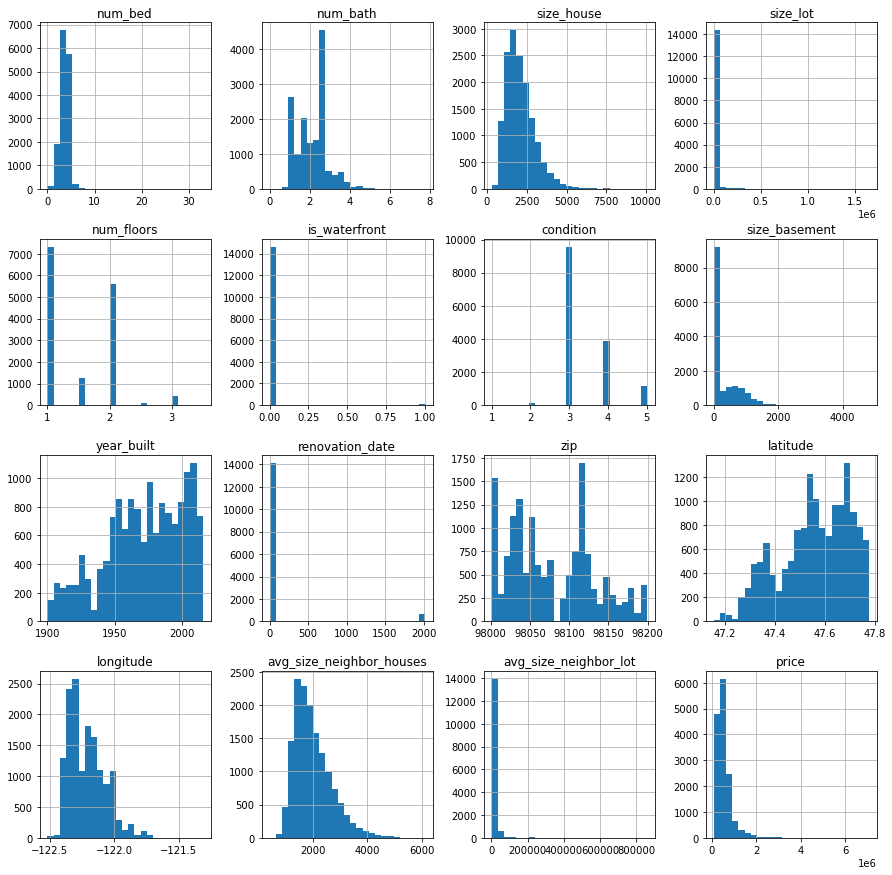

In [9]:
#checking numerical destribution
plot = data.hist(bins=25, figsize = (15,15))

In [10]:
#exloring the data
data.describe()

,num_bed,num_bath,size_house,size_lot,num_floors,is_waterfront,condition,size_basement,year_built,renovation_date,zip,latitude,longitude,avg_size_neighbor_houses,avg_size_neighbor_lot,price
count,14758.000000,14758.000000,14758.000000,1.475800e+04,14758.000000,14758.000000,14758.000000,14758.000000,14758.000000,14758.000000,14758.000000,14758.000000,14758.000000,14758.000000,14758.000000,1.475800e+04
mean,3.366107,2.119799,2083.611872,1.496206e+04,1.492851,0.007521,3.410828,294.892533,1971.099471,86.015178,98077.967746,47.560000,-122.214471,1987.933392,12528.257420,5.419394e+05
std,0.936158,0.770814,912.056422,4.144406e+04,0.540649,0.086402,0.653292,442.798462,29.244435,405.343262,53.430422,0.138666,0.140465,686.496006,26354.333283,3.683758e+05
min,0.000000,0.000000,290.000000,5.200000e+02,1.000000,0.000000,1.000000,0.000000,1900.000000,0.000000,98001.000000,47.155933,-122.518648,399.000000,651.000000,7.800000e+04
25%,3.000000,1.750000,1430.000000,5.067750e+03,1.000000,0.000000,3.000000,0.000000,1952.000000,0.000000,98033.000000,47.472466,-122.328591,1480.000000,5100.000000,3.220000e+05
50%,3.000000,2.250000,1920.000000,7.620000e+03,1.500000,0.000000,3.000000,0.000000,1975.000000,0.000000,98065.000000,47.571137,-122.232074,1840.000000,7620.000000,4.500000e+05
75%,4.000000,2.500000,2560.000000,1.070950e+04,2.000000,0.000000,4.000000,570.000000,1997.000000,0.000000,98118.000000,47.678187,-122.126427,2370.000000,10080.000000,6.486540e+05
max,33.000000,7.750000,10040.000000,1.651359e+06,3.500000,1.000000,5.000000,4820.000000,2015.000000,2015.000000,98199.000000,47.777624,-121.315254,6110.000000,858132.000000,7.062500e+06


<AxesSubplot:xlabel='price'>

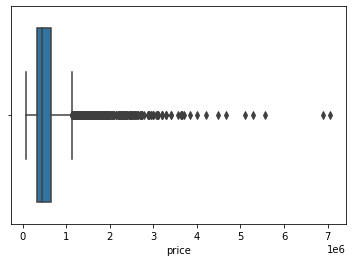

In [11]:
#boxplot - to find the scale of outliers in price
sns.boxplot(x=data.price)

In [12]:
Q1 = data.quantile(0.25)
Q3 = data.quantile(0.75)
IQR = Q3 - Q1
print(IQR)

num_bed                          1.000000
num_bath                         0.750000
size_house                    1130.000000
size_lot                      5641.750000
num_floors                       1.000000
is_waterfront                    0.000000
condition                        1.000000
size_basement                  570.000000
year_built                      45.000000
renovation_date                  0.000000
zip                             85.000000
latitude                         0.205721
longitude                        0.202164
avg_size_neighbor_houses       890.000000
avg_size_neighbor_lot         4980.000000
price                       326654.000000
dtype: float64


In [13]:
#remove outliers by IQR method
data_out_IQR = data[~((data < (Q1 - 1.5 * IQR)) |(data > (Q3 + 1.5 * IQR))).any(axis=1)]
data_out_IQR.shape

(11270, 16)

<AxesSubplot:xlabel='price'>

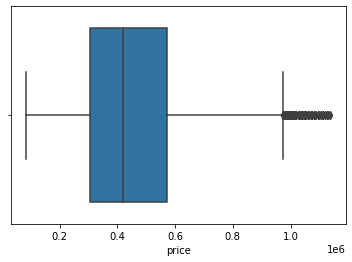

In [14]:
sns.boxplot(x=data_out_IQR.price)

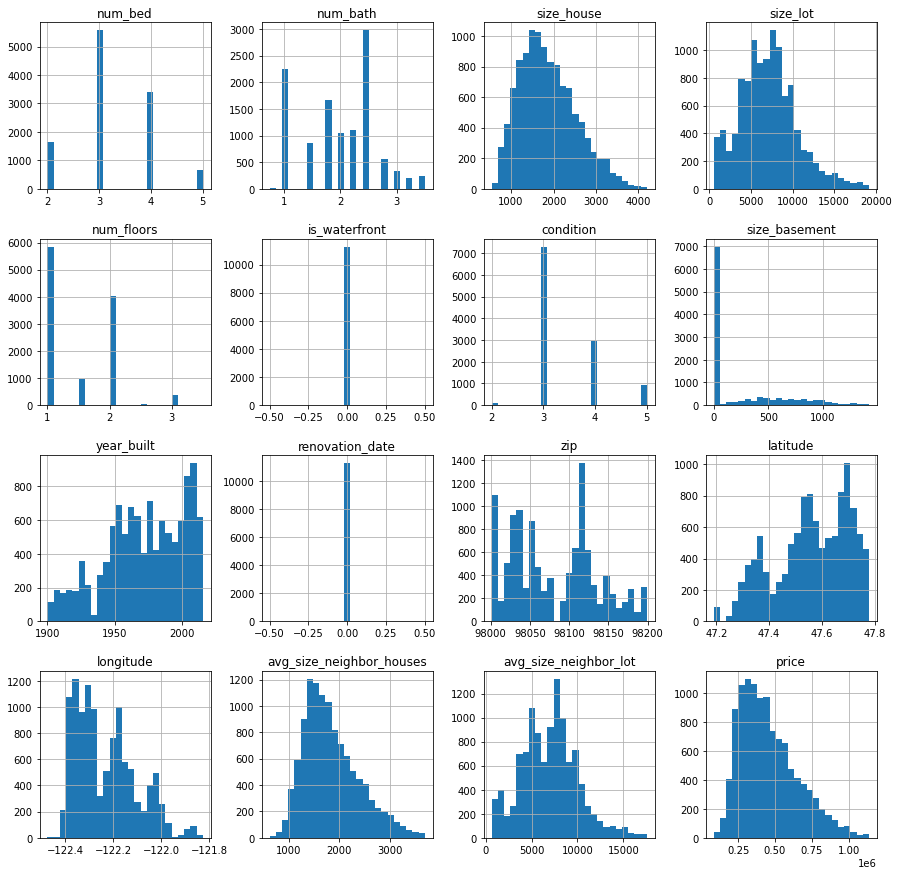

In [15]:
plot = data_out_IQR.hist(bins=25, figsize = (15,15))

In [16]:
Data_clean=data_out_IQR
Data_clean.shape

(11270, 16)

In [17]:
import geopandas as gpd
import geopy

In [18]:
Data_clean.columns

Index(['num_bed', 'num_bath', 'size_house', 'size_lot', 'num_floors',
       'is_waterfront', 'condition', 'size_basement', 'year_built',
       'renovation_date', 'zip', 'latitude', 'longitude',
       'avg_size_neighbor_houses', 'avg_size_neighbor_lot', 'price'],
      dtype='object')

In [19]:
BBox = (Data_clean.latitude.min(),Data_clean.latitude.max(),Data_clean.longitude.min(),Data_clean.longitude.max())
BBox

(47.18947729, 47.77762383, -122.47351, -121.8260903)

In [20]:
seattle = plt.imread('/home/mark/Documents/Stone Case/map.png')

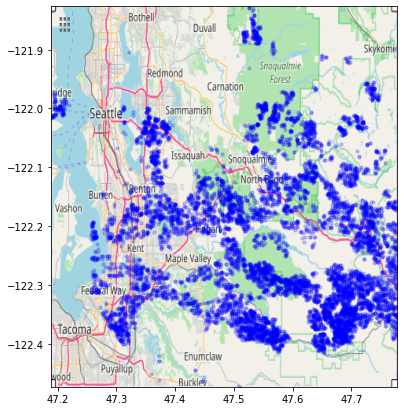

In [21]:
fig, ax = plt.subplots(figsize = (8,7))
ax.scatter(Data_clean.latitude, Data_clean.longitude,zorder=1, alpha= 0.2, c='b', s=10)
ax.set_xlim(BBox[0],BBox[1])
ax.set_ylim(BBox[2],BBox[3])
ax.imshow(seattle, zorder=0, extent = BBox, aspect= 'equal')

In [22]:
# calculate Mean price for each zip code
p1 = pd.pivot_table(Data_clean,index='zip',values='price',aggfunc = 'mean')
p1['zip'] = p1.index
p1 = p1.sort_values('price',ascending=False)

<AxesSubplot:xlabel='zip', ylabel='price'>

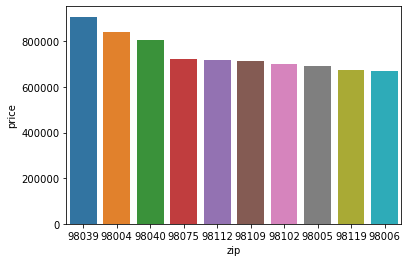

In [23]:
#plotting top 10 expensive zip codes 
sns.barplot(x = p1.zip
            ,y = p1.price, order=p1.zip[:10])
# Conclusion: the most expensive zip code in King County was 98039 followed by 98004 and 98040.

In [24]:
Data_clean.columns

Index(['num_bed', 'num_bath', 'size_house', 'size_lot', 'num_floors',
       'is_waterfront', 'condition', 'size_basement', 'year_built',
       'renovation_date', 'zip', 'latitude', 'longitude',
       'avg_size_neighbor_houses', 'avg_size_neighbor_lot', 'price'],
      dtype='object')

In [25]:
data = pd.read_csv('/home/mark/Documents/Stone Case/case-stone-houses.csv')

In [26]:
p2 = pd.pivot_table(data,index = 'condition',columns = 'is_waterfront' ,values = 'price' ,aggfunc = 'mean')
p2.columns=['avg_price_noWaterFront','avg_price_hasWaterFront']
p2['times']=(p2.avg_price_hasWaterFront/p2.avg_price_noWaterFront)
p2

,avg_price_noWaterFront,avg_price_hasWaterFront,times
condition,,,
1,328378.571429,6.580000e+05,2.003785
2,306331.533898,2.555000e+06,8.340637
3,535403.271436,1.807873e+06,3.376657
4,513525.840198,1.749615e+06,3.407063
5,599425.555270,1.642855e+06,2.740715


In [27]:
(data.is_waterfront==1).sum()

111

In [28]:
(Data_clean.is_waterfront==1).sum()
#conclusion: the houses with water front are totally 111, that the prices in all conditions are all among the 
# outliers from IQR method, and they already removed from the database as their price is unreasonably higher than 
# average price. 

0

In [29]:
Data_clean.columns

Index(['num_bed', 'num_bath', 'size_house', 'size_lot', 'num_floors',
       'is_waterfront', 'condition', 'size_basement', 'year_built',
       'renovation_date', 'zip', 'latitude', 'longitude',
       'avg_size_neighbor_houses', 'avg_size_neighbor_lot', 'price'],
      dtype='object')

<AxesSubplot:xlabel='zip', ylabel='avg_pricePerSquare'>

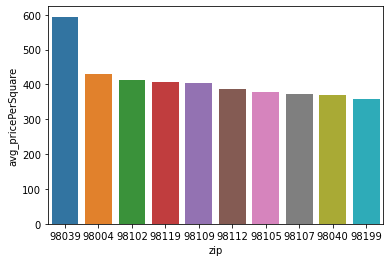

In [30]:
p3=pd.pivot_table(Data_clean,index='zip',values=['size_house','price'],aggfunc='mean')
p3['avg_pricePerSquare'] = (p3.price/p3.size_house)
p3['zip'] = p3.index
p3 = p3.sort_values('avg_pricePerSquare',ascending=False)
sns.barplot(x = p3.zip
            ,y = p3.avg_pricePerSquare,order = p3.zip[:10])

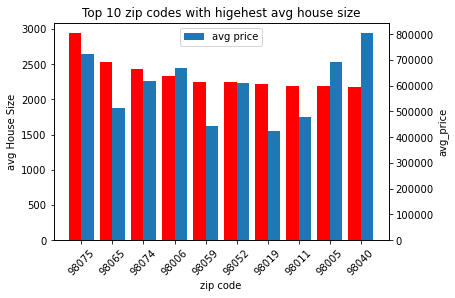

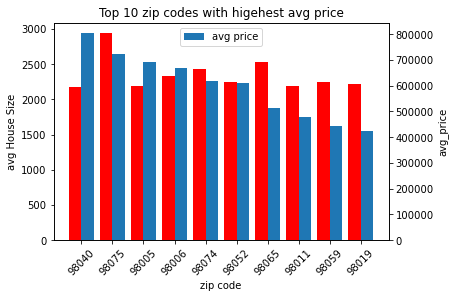

In [31]:
# Plotting Top 10 zip codes with higehest avg house size accompanied by avg pice

p4=pd.pivot_table(Data_clean,index='zip',values=['size_house','price'],aggfunc='mean')
p4.columns=['avg_price','avg_sizeHouse']

p4['zip'] = p4.index
p4 = p4.sort_values('avg_sizeHouse',ascending=False)
p4 = p4[:10]
avg_size = p4.avg_sizeHouse.values
avg_price = p4.avg_price.values

fig,ax1 = plt.subplots()

w = 0.4
bar1 = np.arange(len(avg_size))
bar2 = [i+w for i in bar1]
ax2 = plt.twinx()
ax1.bar(bar1,avg_size,w,label = 'avg house size',color='r') 

ax2.bar(bar2,avg_price,w,label = 'avg price') 


ax1.set_xlabel('zip code')
ax1.set_ylabel('avg House Size')
ax2.set_ylabel('avg_price')

# ax1.legend('size',loc = 'upper center')
# ax2.legend('avg price',loc = 'upper center')

plt.legend(loc = 'upper center')

plt.xticks(bar1+w/2,p4.index)
ax1.tick_params(axis='x', rotation=45)

plt.title('Top 10 zip codes with higehest avg house size')

plt.show()

# Plotting Top 10 zip codes with higehest avg price accompanied by avg house size

p4 = p4.sort_values('avg_price',ascending=False)
p4 = p4[:10]
avg_size = p4.avg_sizeHouse.values
avg_price = p4.avg_price.values

fig,ax1 = plt.subplots()

w = 0.4
bar1 = np.arange(len(avg_size))
bar2 = [i+w for i in bar1]
ax2 = plt.twinx()
ax1.bar(bar1,avg_size,w,label = 'avg house size',color='r') 

ax2.bar(bar2,avg_price,w,label = 'avg price') 


ax1.set_xlabel('zip code')
ax1.set_ylabel('avg House Size')
ax2.set_ylabel('avg_price')

# ax1.legend('size',loc = 'upper center')
# ax2.legend('avg price',loc = 'upper center')

plt.legend(loc = 'upper center')

plt.xticks(bar1+w/2,p4.index)
ax1.tick_params(axis='x', rotation=45)

plt.title('Top 10 zip codes with higehest avg price')
plt.show()

In [32]:
# Conclusion: the correlation between avg price and avg size is different in zip codes, some like 98074, 98006,
# 98052 the correlation is high but in some others like 98075 , 98065 an11, we can buy bigger houses with the 
# budget, and in some zip codes like 98040 and 98005 we can buy smaller houses with the same price, 

In [33]:
Data_clean.columns

Index(['num_bed', 'num_bath', 'size_house', 'size_lot', 'num_floors',
       'is_waterfront', 'condition', 'size_basement', 'year_built',
       'renovation_date', 'zip', 'latitude', 'longitude',
       'avg_size_neighbor_houses', 'avg_size_neighbor_lot', 'price'],
      dtype='object')

In [34]:
# Conclusion; using general analysis, we can find out some stuff related to correlation between the features and 
# price, but the better way is to use a package named shap. which can help us in feature engineering very much, 
# the way it works is actually calculating each feature effect on models result, so to check the output from shap
# I use catboost regressor to train a model and then I will analyze the features using shap.

In [35]:
 # Clustering by pycarret
from pycaret.clustering import *
clu1 = setup(Data_clean,normalize = True,session_id=123)

,Description,Value
0,session_id,123
1,Original Data,"(11270, 16)"
2,Missing Values,False
3,Numeric Features,12
4,Categorical Features,4
5,Ordinal Features,False
6,High Cardinality Features,False
7,High Cardinality Method,None
8,Transformed Data,"(11270, 22)"
9,CPU Jobs,-1


In [36]:
kmeans = create_model('kmeans')

,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1834,2300.1283,1.7191,0,0,0


In [37]:
print(kmeans)

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
       n_clusters=4, n_init=10, n_jobs=-1, precompute_distances='deprecated',
       random_state=123, tol=0.0001, verbose=0)


In [38]:
plot_model(kmeans)

In [65]:
plot_model(kmeans,plot = 'tsne')

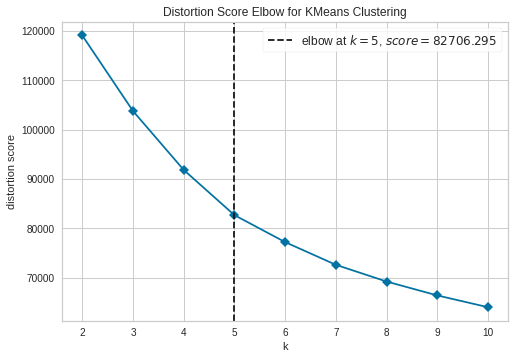

In [39]:
plot_model(kmeans,plot = 'elbow')

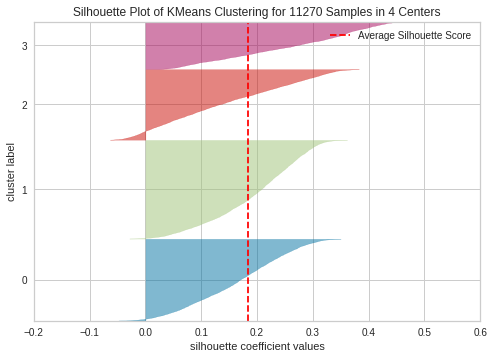

In [40]:
plot_model(kmeans,plot = 'silhouette')

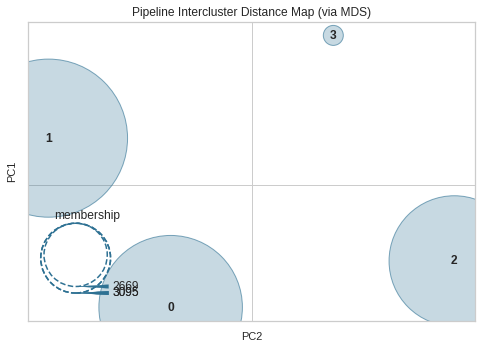

In [41]:
plot_model(kmeans,plot = 'distance')

In [42]:
plot_model(kmeans,plot = 'distribution' , feature = 'price')

In [43]:
kmeans_results = assign_model(kmeans)
kmeans_results.to_csv('Data_addcluster')
price = pd.DataFrame(kmeans_results.price)
latitude = pd.DataFrame(kmeans_results.latitude)
size = pd.DataFrame(kmeans_results.size_house)

In [44]:
from sklearn.preprocessing import MinMaxScaler


scaler = MinMaxScaler()
priceN = scaler.fit_transform(price)
latitudeN = scaler.fit_transform(latitude)
sizeN = scaler.fit_transform(size)

In [45]:
kmeans_results['priceN'] = priceN
kmeans_results['latitudeN'] = latitudeN
kmeans_results['coef1'] = latitudeN/priceN
kmeans_results['sizeN'] = sizeN
kmeans_results['coef2'] = sizeN / priceN

In [46]:
priceN0 = kmeans_results.loc[(kmeans_results.priceN == 0)]
priceN0

,num_bed,num_bath,size_house,size_lot,num_floors,is_waterfront,condition,size_basement,year_built,renovation_date,...,longitude,avg_size_neighbor_houses,avg_size_neighbor_lot,price,Cluster,priceN,latitudeN,coef1,sizeN,coef2
3486,2,1.0,900,8580,1.0,0,3,0,1918,0,...,-122.270216,2060,6533,83000,Cluster 1,0.0,0.481514,inf,0.098361,inf


In [47]:
#droping the priceN=0 row. 
kmeans_results = kmeans_results.drop(3486)

In [48]:
kmeans_results['coef_final'] = (kmeans_results.coef1*50/100 + kmeans_results.coef2*50/100)

In [49]:
# chekcing the coefs in clusters by median & mean
p1 = pd.pivot_table(kmeans_results, index = 'Cluster' , values = ['coef1', 'coef2','coef_final'] , 
                    aggfunc = ['mean','median'])
p1

mean                         median                     
              coef1     coef2 coef_final     coef1     coef2 coef_final
Cluster                                                                
Cluster 0  2.259546  1.476090   1.867818  1.947947  1.337912   1.705207
Cluster 1  2.723020  0.943261   1.833140  2.235776  0.784038   1.538737
Cluster 2  1.325020  1.326002   1.325511  1.224719  1.174589   1.270393
Cluster 3  2.199201  1.047420   1.623310  1.991452  0.882433   1.533051

In [50]:
# if using final coef for selection
p2 = kmeans_results.sort_values('coef_final',ascending = False)
print(p2[:78].price.sum())
coef_final = pd.DataFrame(p2[:78])

10073922


In [70]:
p3 = pd.pivot_table(coef_final,index = 'Cluster',values = ['coef1','coef2','coef_final'] , 
                    aggfunc = ['mean'],margins = True)
p3

mean                     
               coef1     coef2 coef_final
Cluster                                  
Cluster 0  22.121927  7.202440  14.662183
Cluster 1  17.403420  3.323778  10.363599
Cluster 3   8.699607  3.019780   5.859693
All        18.571600  4.459691  11.515645

In [52]:
# if using coef1 half budget selection
p4 = kmeans_results.sort_values('coef1',ascending = False)
print(p4[:45].price.sum())
coef1 = pd.DataFrame(p2[:45])

5228950


In [71]:
p5 = pd.pivot_table(coef1,index = 'Cluster',values = ['coef1','coef2','coef_final'] , 
                    aggfunc = ['mean'],margins = True)
p5

mean                     
               coef1     coef2 coef_final
Cluster                                  
Cluster 0  31.563721  9.680155  20.621938
Cluster 1  23.359307  3.911313  13.635310
All        25.911792  5.706064  15.808928

In [54]:
# if using coef2 half budget selection
p6 = kmeans_results.sort_values('coef2',ascending = False)
print(p6[:42].price.sum())
coef2 = pd.DataFrame(p2[:42])

5656850


In [55]:
p7 = pd.pivot_table(coef2,index = 'Cluster',values = ['price','coef1','coef2','coef_final'] , 
                    aggfunc = ['count','mean','median'],margins = True)
p7

count                              mean                        \
          coef1 coef2 coef_final price      coef1      coef2 coef_final   
Cluster                                                                   
Cluster 0    13    13         13    13  33.420904  10.017553  21.719229   
Cluster 1    29    29         29    29  24.280953   3.968562  14.124758   
All          42    42         42    42  27.109986   5.840869  16.475427   

                             median                               
                   price      coef1     coef2 coef_final   price  
Cluster                                                           
Cluster 0  112307.692308  14.290003  4.452683   9.313362  110000  
Cluster 1  115943.103448  17.649778  2.970255   9.775677  115000  
All        114817.857143  17.638417  3.734073   9.736069  115000

In [56]:
#all from coef1 & coef2
coef12 = coef1.append(coef2)
coef12.price.sum()

10031000

In [57]:
p8 = pd.pivot_table(coef12,index = 'Cluster',values = ['price','coef1','coef2','coef_final'] , 
                    aggfunc = ['count','mean','median'],margins = True)
p8

count                             mean                       \
          coef1 coef2 coef_final price     coef1     coef2 coef_final   
Cluster                                                                 
Cluster 0    27    27         27    27  32.45792  9.842606  21.150263   
Cluster 1    60    60         60    60  23.80477  3.938983  13.871876   
All          87    87         87    87  26.49023  5.771142  16.130686   

                             median                                 
                   price      coef1     coef2 coef_final     price  
Cluster                                                             
Cluster 0  112270.370370  14.290003  4.452683   9.313362  110000.0  
Cluster 1  116661.666667  17.638417  2.970255   9.736069  116562.5  
All        115298.850575  17.627056  3.794682   9.696461  115000.0

In [58]:
kmeans_results2 = kmeans_results.copy()

In [59]:
kmeans_results2['Cluster'] = kmeans_results2['Cluster'].str.replace('Cluster','').apply(int)

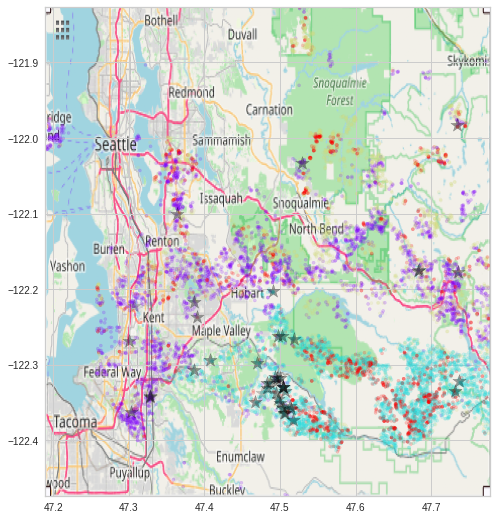

In [60]:
fig, ax = plt.subplots(figsize = (10,9))
ax.scatter(kmeans_results2.latitude, kmeans_results2.longitude,zorder=1, alpha= 0.2, 
           c=kmeans_results2.Cluster, s=10,cmap = 'rainbow')
ax.scatter(coef12.latitude, coef12.longitude,zorder=1, alpha= 0.2, 
            s=200,color = 'black',marker = '*')
ax.set_xlim(BBox[0],BBox[1])
ax.set_ylim(BBox[2],BBox[3])
ax.imshow(seattle, zorder=0, extent = BBox, aspect= 'equal')

In [61]:
coef12.head()

,num_bed,num_bath,size_house,size_lot,num_floors,is_waterfront,condition,size_basement,year_built,renovation_date,...,avg_size_neighbor_houses,avg_size_neighbor_lot,price,Cluster,priceN,latitudeN,coef1,sizeN,coef2,coef_final
475,2,1.0,910,9753,1.0,0,3,0,1947,0,...,1160,7405,85000,Cluster 0,0.001897,0.340467,179.511470,0.101093,53.301230,116.406350
10379,2,1.0,790,2640,1.0,0,3,0,1973,0,...,1310,2064,90000,Cluster 1,0.006638,0.927675,139.747620,0.068306,10.289813,75.018716
6645,3,1.0,840,9480,1.0,0,3,0,1960,0,...,840,9420,86500,Cluster 0,0.003319,0.235038,70.813491,0.081967,24.695550,47.754521
8026,2,1.0,760,5500,1.5,0,3,0,1947,0,...,1040,5515,92000,Cluster 1,0.008535,0.535598,62.754212,0.060109,7.042805,34.898509
1699,3,1.0,900,4750,1.0,0,4,0,1969,0,...,900,3404,89000,Cluster 0,0.005690,0.192285,33.794093,0.098361,17.286885,25.540489


In [62]:
selected_data = coef12.drop(['priceN','latitudeN','coef1','sizeN','coef2','coef_final'],axis=1)

In [63]:
selected_data

,num_bed,num_bath,size_house,size_lot,num_floors,is_waterfront,condition,size_basement,year_built,renovation_date,zip,latitude,longitude,avg_size_neighbor_houses,avg_size_neighbor_lot,price,Cluster
475,2,1.00,910,9753,1.0,0,3,0,1947,0,98032,47.389722,-122.236404,1160,7405,85000,Cluster 0
10379,2,1.00,790,2640,1.0,0,3,0,1973,0,98034,47.735086,-122.177753,1310,2064,90000,Cluster 1
6645,3,1.00,840,9480,1.0,0,3,0,1960,0,98023,47.327714,-122.341112,840,9420,86500,Cluster 0
8026,2,1.00,760,5500,1.5,0,3,0,1947,0,98168,47.504487,-122.329449,1040,5515,92000,Cluster 1
1699,3,1.00,900,4750,1.0,0,4,0,1969,0,98023,47.302569,-122.362954,900,3404,89000,Cluster 0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5311,3,1.00,1270,8508,1.0,0,4,620,1942,0,98168,47.496055,-122.321776,1200,9415,134000,Cluster 1
11992,3,1.00,1150,8924,1.0,0,3,0,1943,0,98030,47.386541,-122.216707,1492,8924,120000,Cluster 0
14044,2,1.00,780,5300,1.0,0,3,0,1941,0,98146,47.513010,-122.354342,780,5300,130000,Cluster 1
2601,3,1.75,1160,5082,1.0,0,3,580,1942,0,98178,47.502964,-122.262176,1730,6000,137900,Cluster 1


In [72]:
selected_data.to_csv('Selected houses.csv')